In [73]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import  accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [74]:
df=pd.read_csv('/content/churn-bigml-80.csv')

In [75]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [77]:
df.isnull().sum()
df = df.dropna()

In [78]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [79]:
df.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'WV', 'RI', 'IA', 'MT',
       'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'NE', 'WY', 'IL', 'NH',
       'LA', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR', 'DE', 'IN', 'UT', 'CA',
       'SD', 'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'NY', 'KY', 'ME', 'MS',
       'MI', 'SC', 'TN', 'PA', 'HI', 'ND', 'CT'], dtype=object)

<Axes: xlabel='Customer service calls', ylabel='count'>

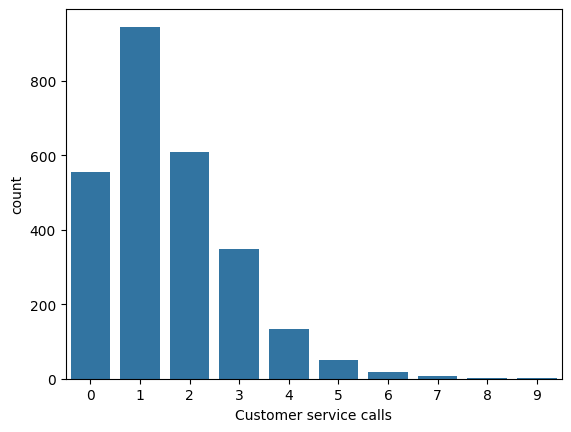

In [80]:
sns.countplot(x=df['Customer service calls'])

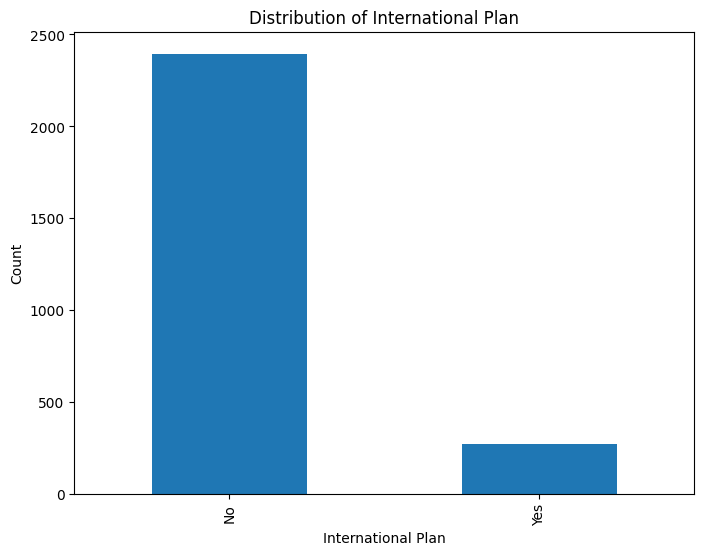

In [81]:
plt.figure(figsize=(8,6))
df['International plan'].value_counts().plot(kind='bar')
plt.title('Distribution of International Plan')
plt.xlabel('International Plan')
plt.ylabel('Count')
plt.show()

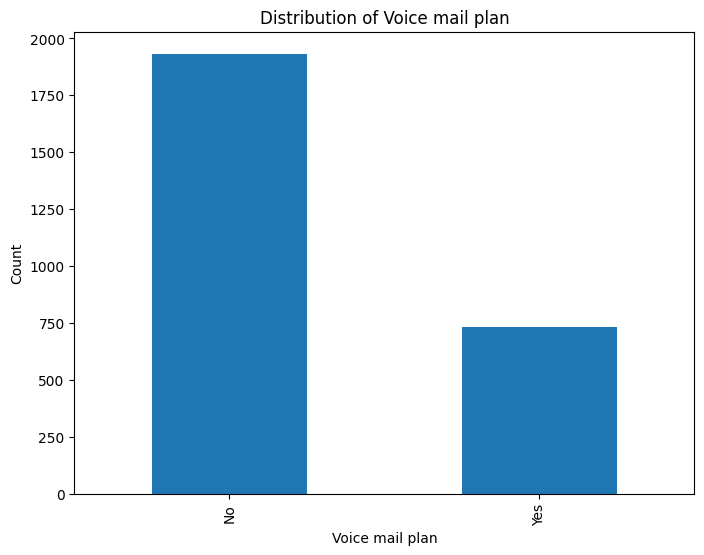

In [82]:
plt.figure(figsize=(8,6))
df['Voice mail plan'].value_counts().plot(kind='bar')
plt.title('Distribution of Voice mail plan')
plt.xlabel('Voice mail plan')
plt.ylabel('Count')
plt.show()

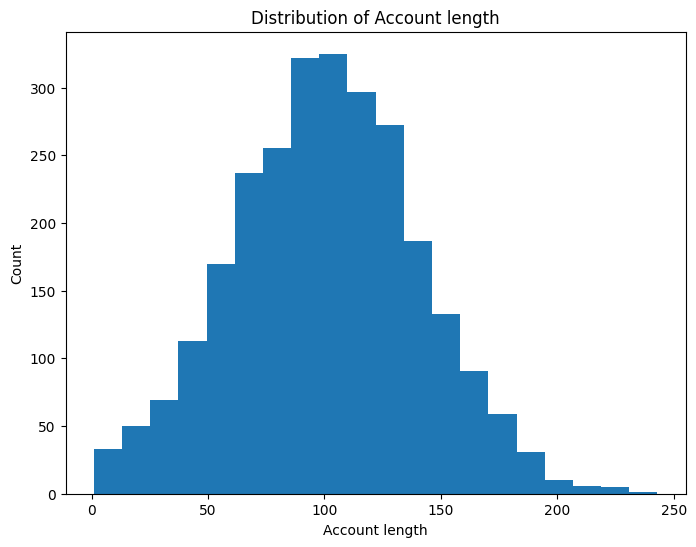

In [83]:
plt.figure(figsize=(8,6))
df['Account length'].plot(kind='hist', bins = 20)
plt.title('Distribution of Account length')
plt.xlabel('Account length')
plt.ylabel('Count')
plt.show()

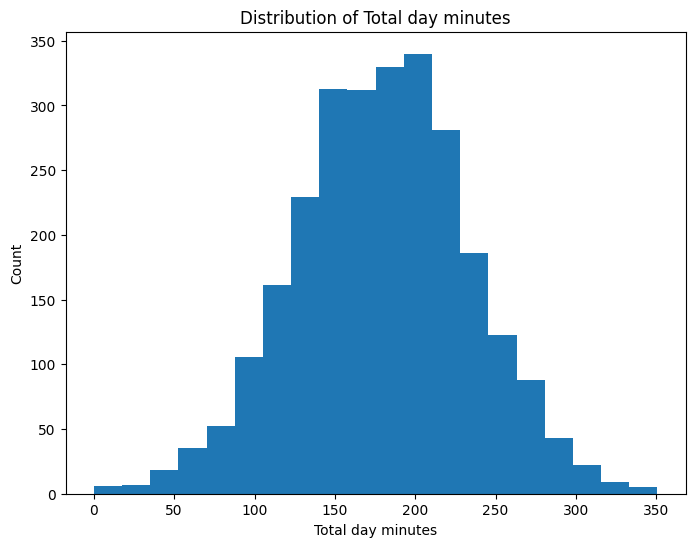

In [84]:
plt.figure(figsize=(8,6))
df['Total day minutes'].plot(kind='hist', bins = 20)
plt.title('Distribution of Total day minutes')
plt.xlabel('Total day minutes')
plt.ylabel('Count')
plt.show()

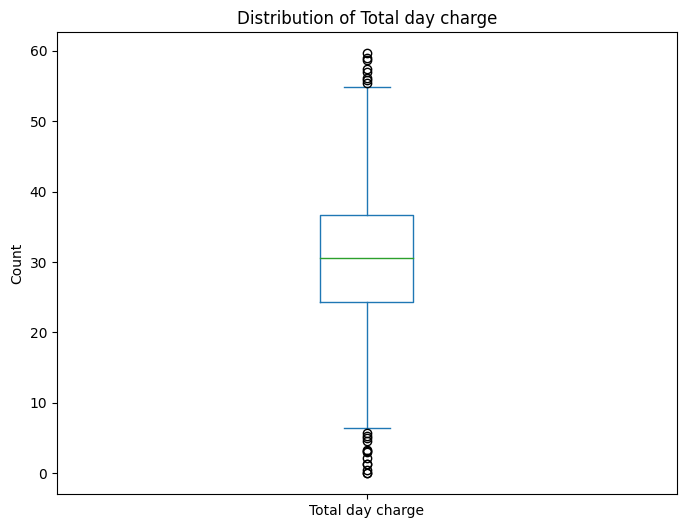

In [85]:
plt.figure(figsize=(8,6))
df['Total day charge'].plot(kind='box')
plt.title('Distribution of Total day charge')
#plt.xlabel('Total day charge')
plt.ylabel('Count')
plt.show()

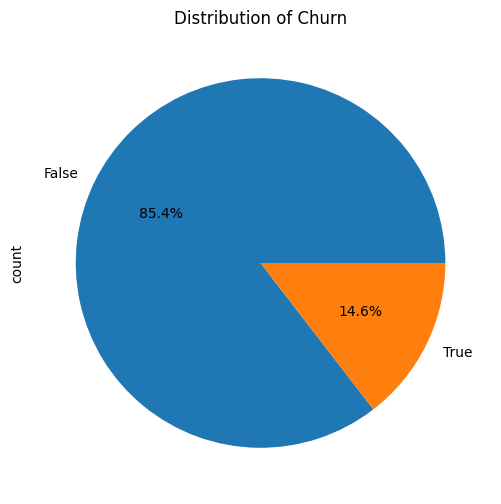

In [86]:
plt.figure(figsize=(8,6))
df['Churn'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Churn')
plt.show()

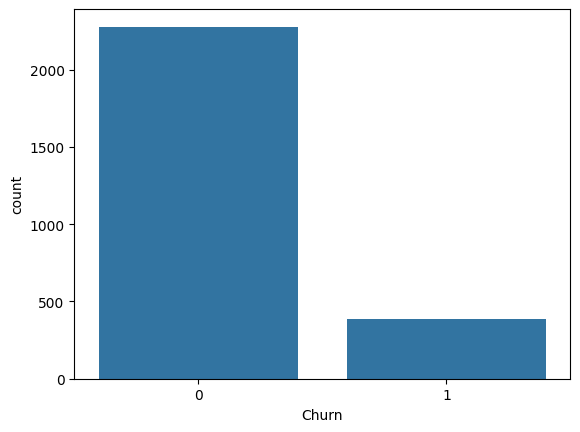

In [87]:
df['Churn']=df['Churn'].map({False:0, True:1})
sns.countplot(x=df['Churn']);

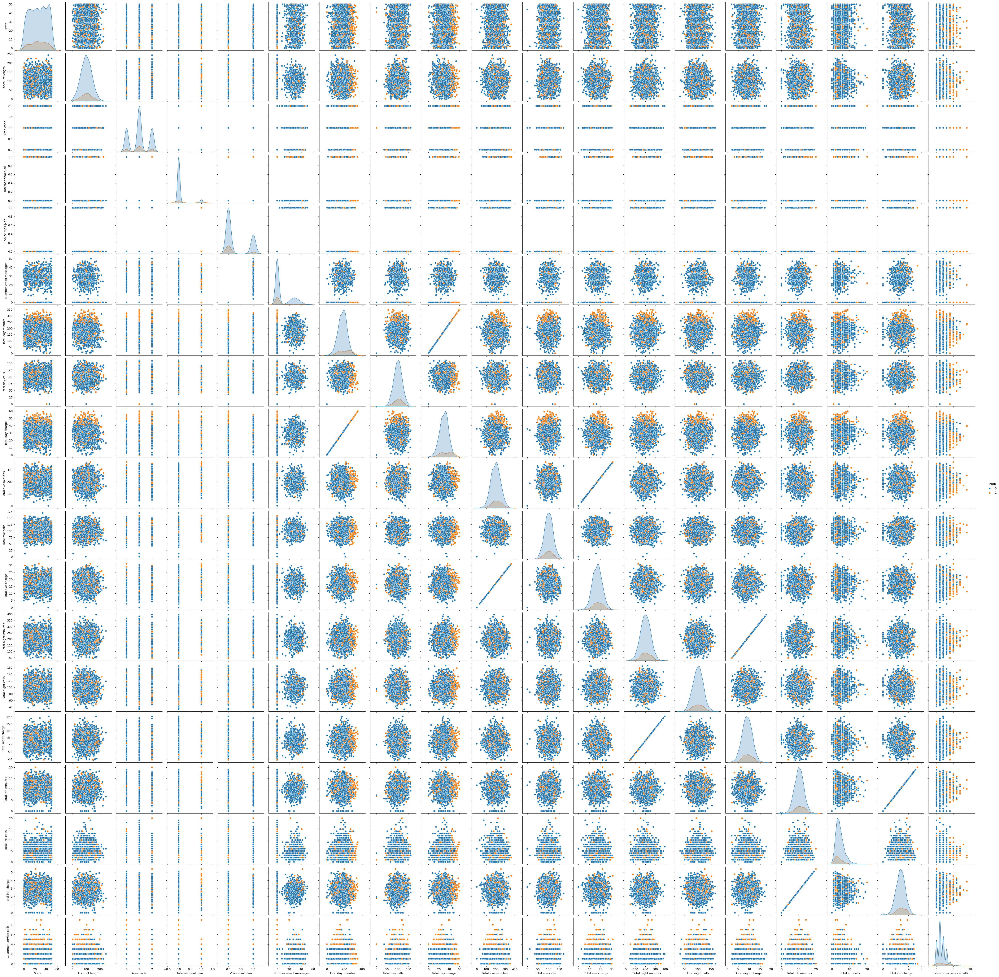

In [ ]:
sns.pairplot(df, hue='Churn')

In [88]:
le = LabelEncoder()
df['Area code'] = le.fit_transform(df['Area code'])
df['State'] = le.fit_transform(df['State'])
df['International plan'] = le.fit_transform(df['International plan'])
df['Voice mail plan'] = le.fit_transform(df['Voice mail plan'])

In [89]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,128,1,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,1,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,1,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,0,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,1,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,40,79,1,0,0,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0
2662,3,192,1,0,1,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
2663,49,68,1,0,0,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
2664,39,28,2,0,0,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0


In [91]:
x=df.drop('Churn',axis=1)
y=df['Churn']
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [94]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

In [96]:
log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

RandomForestClassifier()

In [99]:
y_pred_lg = log_reg.predict(x_test)
y_pred_rf = rf.predict(x_test)

In [100]:
y_pred_lg

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,

In [101]:
y_pred_rf

array([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,

In [102]:
accuracy = accuracy_score(y_test, y_pred_lg)
precision = precision_score(y_test, y_pred_lg)
recall = recall_score(y_test, y_pred_lg)
f1 = f1_score(y_test, y_pred_lg)

In [106]:
result_lg = pd.DataFrame({'Metric':['Accuracy','Precision','Recall','F1 Score'],
                       'Value': [accuracy, precision, recall, f1]})
print(result_lg)

      Metric     Value
0   Accuracy  0.857678
1  Precision  0.545455
2     Recall  0.227848
3   F1 Score  0.321429


In [109]:
cm_lg = confusion_matrix(y_test, y_pred_lg)
print(cm_lg)

[[440  15]
 [ 61  18]]


In [105]:
print(classification_report(y_test, y_pred_lg))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       455
           1       0.55      0.23      0.32        79

    accuracy                           0.86       534
   macro avg       0.71      0.60      0.62       534
weighted avg       0.83      0.86      0.83       534



In [107]:
accuracy = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)

In [108]:
result_rf = pd.DataFrame({'Metric':['Accuracy','Precision','Recall','F1 Score'],
                       'Value': [accuracy, precision, recall, f1]})
print(result_rf)

      Metric     Value
0   Accuracy  0.951311
1  Precision  0.981818
2     Recall  0.683544
3   F1 Score  0.805970


In [110]:
cm_rf = confusion_matrix(y_test, y_pred_rf)
print(cm_rf)

[[454   1]
 [ 25  54]]


In [111]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       455
           1       0.98      0.68      0.81        79

    accuracy                           0.95       534
   macro avg       0.96      0.84      0.89       534
weighted avg       0.95      0.95      0.95       534



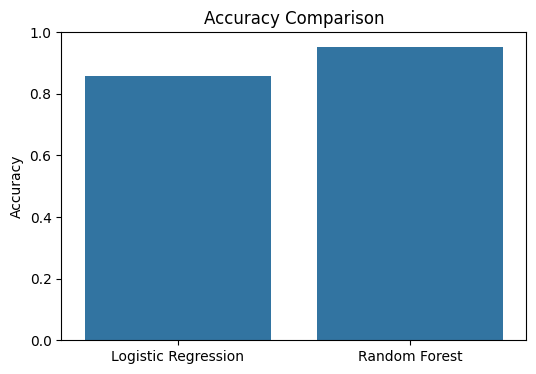

In [114]:
logreg_accuracy = accuracy_score(y_test, y_pred_lg)
rf_accuracy = accuracy_score(y_test, y_pred_rf)

plt.figure(figsize=(6, 4))
models = ['Logistic Regression', 'Random Forest']
accuracies = [logreg_accuracy, rf_accuracy]
sns.barplot(x=models, y=accuracies)
plt.title('Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()

In [126]:
!pip install --upgrade scikit-learn
import joblib

# Save the model
joblib.dump(rf, 'customer_churn_model.pkl')

# Load the model
loaded_model = joblib.load('customer_churn_model.pkl')

# Load new data
new_data = pd.read_csv('/content/churn-bigml-20.csv')

# Check scikit-learn version
import sklearn
print(sklearn.__version__)

# Get the feature names the model was trained on
# (make sure this reflects how you trained the original model)
training_features = ['State', 'Account length', 'Area code', 'International plan',
                     'Voice mail plan', 'Number vmail messages', 'Total day minutes',
                     'Total day calls', 'Total day charge', 'Total eve minutes',
                     'Total eve calls', 'Total eve charge', 'Total night minutes',
                     'Total night calls', 'Total night charge', 'Total intl minutes',
                     'Total intl calls', 'Total intl charge', 'Customer service calls'] # Replace ... with the rest of your features

# Select only those features from the new data
new_data_subset = new_data[training_features]

# Identify columns with non-numeric data in the subset
non_numeric_cols = new_data_subset.select_dtypes(exclude=['number']).columns

# Apply label encoding to non-numeric columns in the subset
for col in non_numeric_cols:
    le = LabelEncoder()
    new_data_subset[col] = le.fit_transform(new_data_subset[col])

# Make predictions
predictions = loaded_model.predict(new_data_subset) # Predict on the subset with correct features

# Save the results
new_data['Predictions'] = predictions
new_data.to_csv('predictions.csv', index=False)

1.3.2


<ipython-input-126-b22c00e66bd4>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data_subset[col] = le.fit_transform(new_data_subset[col])
<ipython-input-126-b22c00e66bd4>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data_subset[col] = le.fit_transform(new_data_subset[col])
<ipython-input-126-b22c00e66bd4>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation